In [2]:
#Import package from the script
import sys
sys.path.insert(0,"Loading/")
sys.path.insert(0,"Preprocessing/")
sys.path.insert(0,"Modeling/")
sys.path.insert(0,"Evaluation/")
sys.path.insert(0,"Interpretability/")
sys.path.insert(0,"Monitoring/")
sys.path.insert(0,"Statistical_dependance/")
sys.path.insert(0,"Utils/")


import loading
import preprocessing
import interpretability
import utils as u
import modeling
import evaluation
import statistical_dependance as stats_dep

import json 
import pandas_profiling
import pandas as pd
import numpy as np

In [3]:
#Load of the conf file 
path_conf ="../params/conf/conf.json"
conf = json.load(open(path_conf, 'r'))

# Launch the logger only once 
path_log = conf['path_log'] # "../log/my_log_file.txt"
log_level = conf['log_level'] # "DEBUG"
logger = u.my_get_logger(path_log, log_level, my_name="main_logger")

## Loading and EDA

In [4]:
#Reading of the dataset selected in the conf file
df = loading.read_csv_from_name(conf)
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [5]:
#Doing the EDA thanks to Pandas Profilling 
df.profile_report()

Render HTML: 100%|██████████| 1/1 [00:08<00:00,  8.58s/it]


## Statistical Dependance

The statistic test:  5.689907363597645
The p-value of the test:  0.4588072571519781
Degrees of freedom:  6


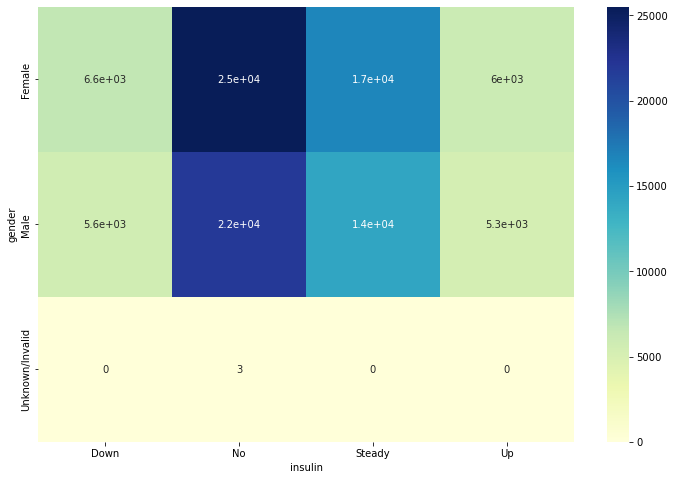

In [5]:
# Question 2.1: Stast dependance between job and education

result_test1 = stats_dep.stat_dep_cat_cat(conf, df, 'gender', 'insulin')
print('The statistic test: ', result_test1[0])
print('The p-value of the test: ', result_test1[1])
print('Degrees of freedom: ', result_test1[2])

,sum_sq,df,F,PR(>F)
age,10814.700481,9.0,136.465883,3.762453e-257
Residual,895999.820557,101756.0,NaN,NaN


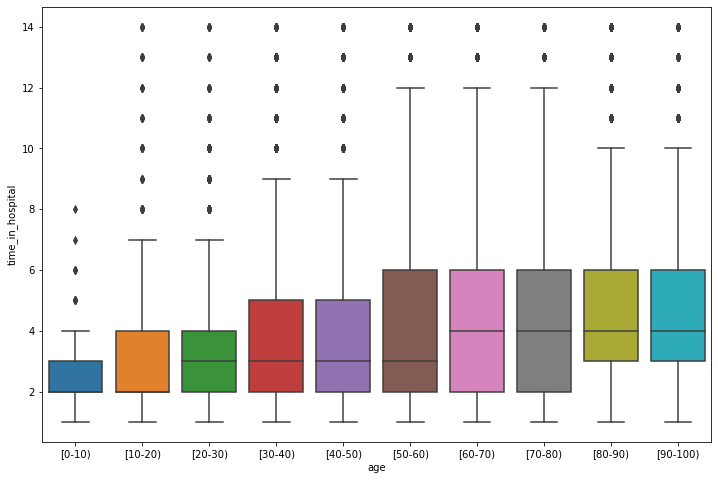

In [10]:
# Question 2.2: statistique dependance between martial and duration

result_test2 = stats_dep.stat_dep_cat_cont(conf, df, 'age', 'time_in_hospital')
result_test2

Pearson’s correlation coefficient : 0.3857672728485534
The p-value of the test:  0.0


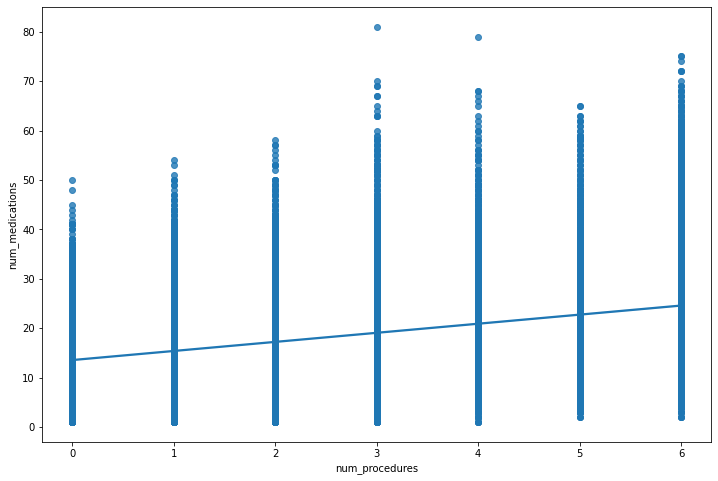

In [11]:
# Question 2.3: statistique dependance between age and balance

result_test3 = stats_dep.stat_dep_cont_cont(conf, df, 'num_procedures', 'num_medications')
print('Pearson’s correlation coefficient :', result_test3[0])
print('The p-value of the test: ', result_test3[1])

## Preprocessing

In [6]:
#Preprocessing of the selected dataset
df_preprocessed, X_columns, y_column, encoding_dict = preprocessing.main_preprocessing_from_name(df, conf)

#Writting of the preprocessed dataset
loading.write_preprocessed_csv_from_name(df_preprocessed, conf, 'data_preprocessed.csv')

#Writting the encoding dictionnary 
loading.write_dict_json_from_name(encoding_dict, conf, 'encoding_dict.json')

#Visualize the preprocessed dataset
df_preprocessed.head()

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.


,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2.0,0.0,5.0,0.0,6.0,25.0,1.0,1.0,0.0,26.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2.0,0.0,15.0,0.0,1.0,1.0,7.0,3.0,0.0,51.0,...,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,0.0,0.0,25.0,0.0,1.0,1.0,7.0,2.0,0.0,51.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,2.0,1.0,35.0,0.0,1.0,1.0,7.0,2.0,0.0,51.0,...,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2.0,1.0,45.0,0.0,1.0,1.0,7.0,1.0,0.0,51.0,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


#### Spliting the data

In [7]:
#Basic Splitting between train and test
X_train, X_test, y_train, y_test = preprocessing.basic_split(df_preprocessed, 0.25, X_columns, y_column)

## Modeling

In [8]:
#Modelisation using the model selected in the conf file
model, best_params = modeling.main_modeling_from_name(X_train, y_train, conf)

#Saving the model
u.save_model(model, conf)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


'OK'

## Evaluation

In [5]:
#Independent step from the other, we reload what we need:
#Can be lauched without the previous steps

#Loading of the model
model = u.load_model(conf)
#Loading of the preprocessed dataset
df = loading.load_preprocessed_csv_from_name(conf, 'data_preprocessed.csv')
#Loading the encodinf dictionnary 
encoding_dict = loading.load_dict_json_from_name(conf, 'encoding_dict.json')

#Basic Splitting:
y_column = u.get_y_column_from_conf(conf)
X_columns = [x for x in df.columns if x != y_column]
X_train, X_test, y_train, y_test = preprocessing.basic_split(df, 0.25, X_columns, y_column)

../Outputs/Models/diabetic_random_forest.sav


{'f1_score': 0.8716704880193382,
 'accuracy': 0.8751277415297539,
 'roc_accuracy': 0.9404305463734832,
 'recall': 0.8318698347107438,
 'precision': 0.887572333976302,
 'confusion_matrix': {'tn': 12602, 'fp': 1224, 'fn': 1953, 'tp': 9663}}

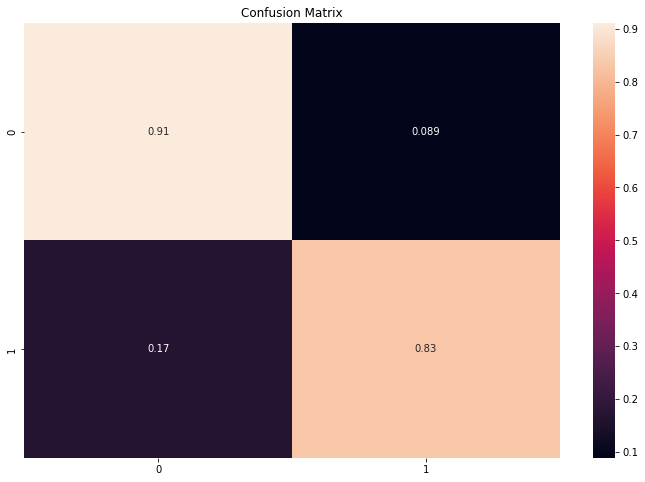

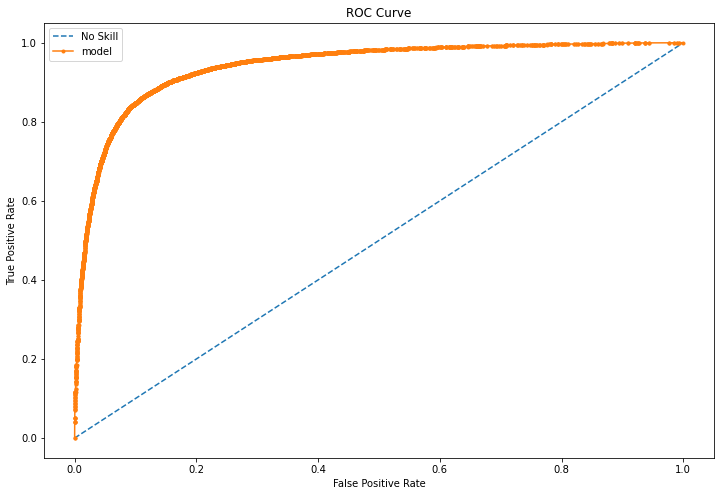

In [16]:
#Computing metrics
dict_metrics = evaluation.main_evaluation(model, X_test, y_test, conf)
dict_metrics

## Interpretabily 

{'metformin-pioglitazone': 0.0,
 'metformin-rosiglitazone': 0.0,
 'glimepiride-pioglitazone': 0.0,
 'citoglipton': 0.0,
 'examide': 0.0,
 'troglitazone': 0.0,
 'acetohexamide': 0.0,
 'glipizide-metformin': 1.3102038677215155e-05,
 'tolbutamide': 1.3102038677215155e-05,
 'miglitol': 1.441224254493667e-05,
 'tolazamide': 1.7032650280379703e-05,
 'chlorpropamide': 0.000127089775168987,
 'acarbose': 0.00018866935695190933,
 'nateglinide': 0.0006249672449032739,
 'glyburide-metformin': 0.0006564121377286014,
 'repaglinide': 0.0012171793931135765,
 'max_glu_serum': 0.002716052617787357,
 'glimepiride': 0.003285991300246327,
 'rosiglitazone': 0.004704942088989061,
 'pioglitazone': 0.005045595094596722,
 'weight': 0.006422619359572357,
 'glyburide': 0.007270321261988355,
 'glipizide': 0.009510769875792668,
 'A1Cresult': 0.01520884649651485,
 'metformin': 0.018543315339866872,
 'change': 0.02088858026308892,
 'race': 0.022002253550652474,
 'gender': 0.024477228656778992,
 'insulin': 0.030982390

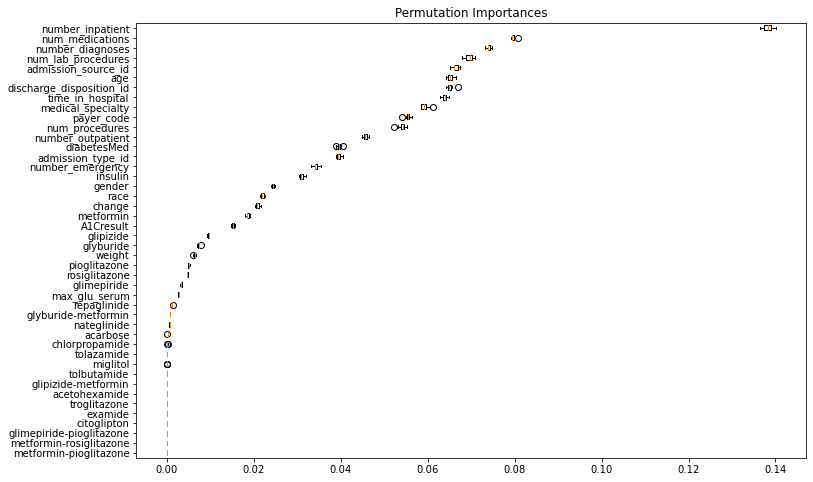

In [17]:
#Get The features importance by permutation 

interpretability.permutation_features_importance(conf, model, X_train, y_train)

#### SHAP

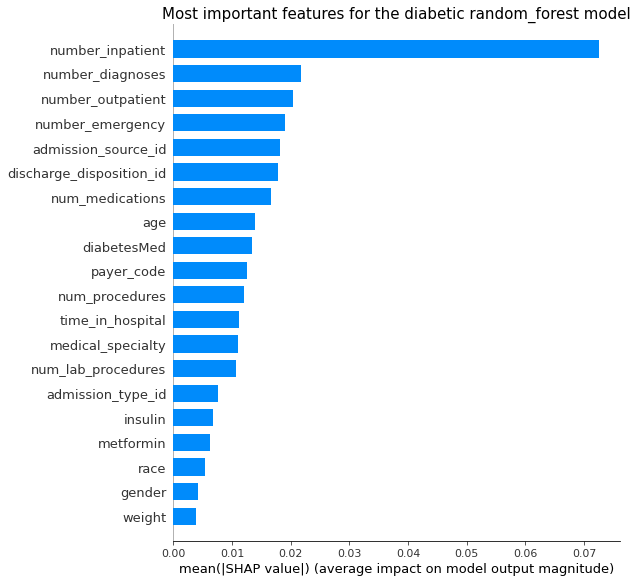

<Figure size 432x288 with 0 Axes>

In [7]:
#Initialize the SHAP class
shap_analysis = interpretability.shap_analysis(model, X_test, y_test, conf)

# Variable Importance graphic
shap_analysis.features_importance()

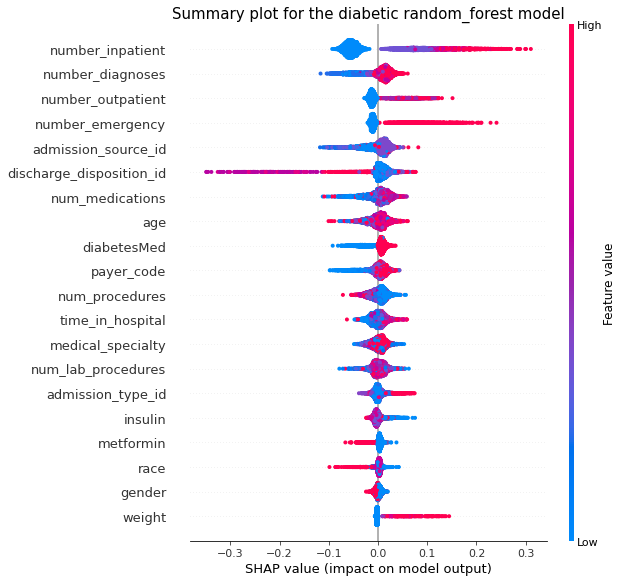

<Figure size 432x288 with 0 Axes>

In [8]:
# summary plot
# Features importance + effect of the features according to their value
shap_analysis.summary_plot()

In [9]:
#global interpretation 
shap_analysis.global_force_plot(n=1000)

In [10]:
#Local evaluation of the model
shap_analysis.local_force_plot(i=0)

For the 0 th value the predicted value of y is 0.0 . Nevertheless, the true value of y is 0.0



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


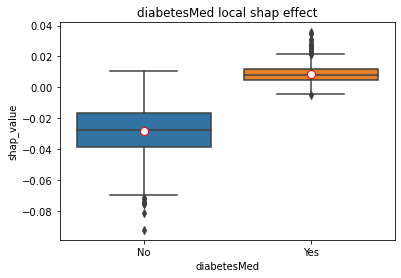

In [11]:
#Watch the effect of each category for the job
shap_var_importance = shap_analysis.cat_features_explanability('diabetesMed', encoding_dict)

#### DICE

In [12]:
# Initialize the DICE class
dice_interpretability = interpretability.dice_interpretability(model, X_test, y_test, conf)

#Generate counterfactuals for a given input point
dice_interpretability.local_interpretability()

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

Query instance (original outcome : 1)


,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,target
0,2.0,0.0,75.0,0.0,3.0,22.0,1.0,1.0,17.0,72.0,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1



Diverse Counterfactual set (new outcome: 0.0)


,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,target
0,-,-,-,-,-,-,-,12.0,-,-,...,-,-,-,-,-,-,-,1.0,-,0.0
1,-,-,-,-,-,-,-,-,1.0,-,...,-,-,-,-,-,-,-,-,-,0.0
2,-,-,-,-,-,-,-,-,1.0,-,...,-,-,-,-,-,-,-,-,-,0.0
3,-,-,-,-,5.0,-,-,-,2.0,-,...,-,-,-,-,-,-,-,-,-,0.0


100%|██████████| 1000/1000 [14:23<00:00,  1.16it/s]


{'number_inpatient': 0.2395,
 'discharge_disposition_id': 0.2225,
 'number_emergency': 0.1896,
 'number_outpatient': 0.0911,
 'num_medications': 0.0681,
 'number_diagnoses': 0.0575,
 'admission_source_id': 0.0557,
 'num_lab_procedures': 0.0543,
 'age': 0.0532,
 'payer_code': 0.0522,
 'medical_specialty': 0.0498,
 'weight': 0.0478,
 'time_in_hospital': 0.0427,
 'num_procedures': 0.0416,
 'race': 0.0342,
 'admission_type_id': 0.0334,
 'metformin': 0.0293,
 'insulin': 0.0291,
 'diabetesMed': 0.0272,
 'A1Cresult': 0.027,
 'glimepiride': 0.0252,
 'max_glu_serum': 0.0241,
 'rosiglitazone': 0.0241,
 'glyburide': 0.0239,
 'glipizide': 0.0227,
 'pioglitazone': 0.0226,
 'nateglinide': 0.0218,
 'repaglinide': 0.0217,
 'chlorpropamide': 0.0198,
 'miglitol': 0.0195,
 'acarbose': 0.0184,
 'gender': 0.018,
 'change': 0.0159,
 'glyburide-metformin': 0.0152,
 'tolazamide': 0.0144,
 'glipizide-metformin': 0.0142,
 'acetohexamide': 0.0,
 'tolbutamide': 0.0,
 'troglitazone': 0.0,
 'examide': 0.0,
 'citogl

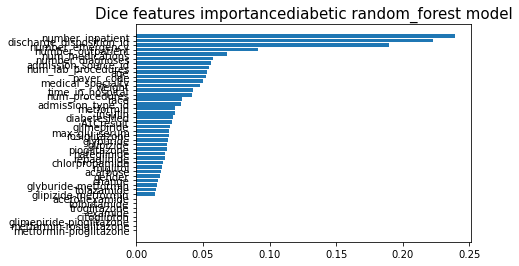

In [13]:
#Calculate the counterfactuals necessity for all features
dice_interpretability.global_interpretability(n=1000)